# Cell type labeling of scRNA-seq data from Parkinson's disease studies

## Description

* This notebook covers functions to assing cell type labels to unsupervised clusters from two studies [Agarwal_2020](https://pubmed.ncbi.nlm.nih.gov/32826893/) and [Kamath_2022](https://pubmed.ncbi.nlm.nih.gov/35513515/).     
* Kamath et al. (2022) provided cell type labels and markers which are used to label unsupervised clusters from the two studies after batch correction.
* Requires the `adata_after_pca_and_clustering.h5ad` file produced by script `02_integration.ipynb`.

In [71]:
### External modules
import warnings
import os
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import logging
import sys
import plotly.express as px
import seaborn as sns
import numpy as np
import matplotlib as plt

import io
import requests

### Logs and warning settings
warnings.filterwarnings("ignore")
logging.basicConfig(level=logging.INFO, format="%(asctime)s %(name)s %(levelname)s:\n%(message)s")
logger = logging.getLogger(__name__)

## Define inputs/outputs.

In [2]:
### base indir h5ad files
in_h5ad = os.path.expanduser('~/sc_and_spatial_parkinson/data/adata')

## Load h5ad adata

In [3]:
adata = sc.read_h5ad(os.path.join(in_h5ad, "adata_after_harmony.h5ad"))
logger.info((f"Concatenated: {adata}"))

2025-06-23 13:22:48,022 __main__ INFO:
Concatenated: AnnData object with n_obs × n_vars = 120955 × 27960
    obs: 'barcode', 'study_name', 'sample_name', 'sample_source', 'sample_organism', 'sample_tissue_region', 'donor_gender', 'donor_age_years', 'cause_of_death', 'main_cell_type', 'cell_type', 'Nurr_status', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'doublet_score', 'predicted_doublet', 'study_name_abv', 'umap_no_batch_corr_1', 'umap_no_batch_corr_2', 'leiden', 'umap_harmony_1', 'umap_harmony_2'
    var: 'gene-0', 'gene-1', 'feature_is_filtered-1', 'feature_name-1', 'feature_reference-1', 'feature_biotype-1', 'feature_length-1', 'feature_type-1', 'mt', 'ribo', 'n_cells_by_c

#### Make an `obs.gene_name` index to use gene names directly (instead looking up ENSG codes)

In [4]:
adata.var['ENSG'] = adata.var.index
adata.var['gene_name'] = np.where(adata.var['gene-0'] == adata.var['gene-1'], adata.var['gene-0'], adata.var['gene-0'].astype(str) + '_' + adata.var['gene-1'].astype(str))
adata.var['gene_name'] = adata.var['gene_name'].replace(r'_ENSG.+', '', regex=True)
adata.var.set_index('gene_name', inplace=True, drop=False)

## Visualize unsupervised clusters and original author cell type annotations
* Use plotly to visualize cell groups behind each other

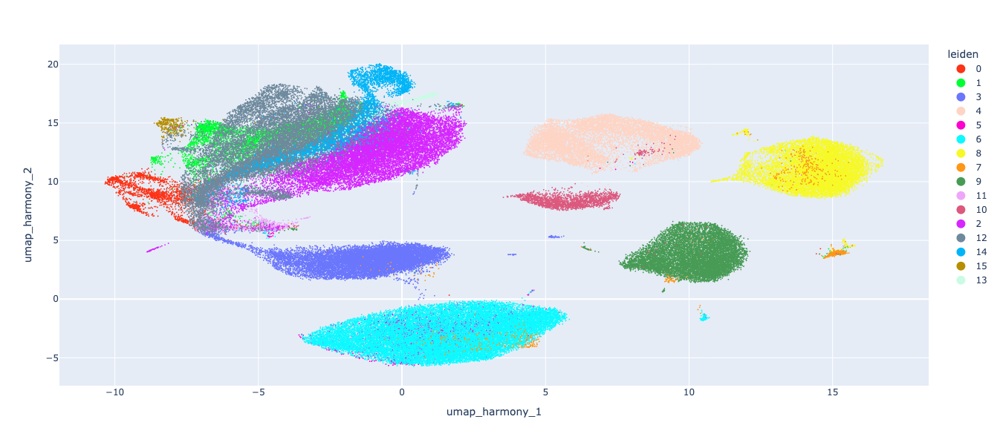

In [9]:
fig = px.scatter(
    adata.obs, x="umap_harmony_1", y="umap_harmony_2",
    color='leiden',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

In [41]:
adata.obs['Kamath_cell_type'] = adata.obs['main_cell_type']
adata.obs['Kamath_cell_type'] = adata.obs['Kamath_cell_type'].cat.add_categories('Agarwal_2020')
adata.obs.loc[(adata.obs['Kamath_cell_type'] == "Unknown") & (adata.obs['study_name_abv'] == "Agarwal_2020"), 'Kamath_cell_type'] = "Agarwal_2020"

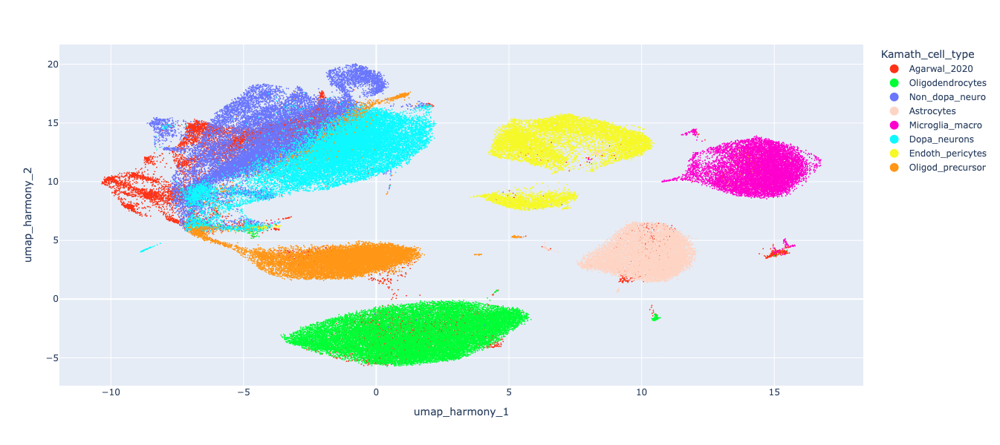

In [42]:
fig = px.scatter(
    adata.obs, x="umap_harmony_1", y="umap_harmony_2",
    color='Kamath_cell_type',
    width=800, height=600,
    color_discrete_sequence=px.colors.qualitative.Light24
)
fig.update_traces(marker=dict(size=2))
fig.update_layout(legend= {'itemsizing': 'constant'})
fig.show()

## Map original author cell type annotations vs. unsupervised clusters
* Use plotly to visualize cell groups behind each other

In [44]:
leiden_v_ct = pd.crosstab(adata.obs['leiden'], adata.obs['Kamath_cell_type'])
leiden_v_ct

Kamath_cell_type,Astrocytes,Dopa_neurons,Endoth_pericytes,Microglia_macro,Non_dopa_neuro,Oligod_precursor,Oligodendrocytes,Agarwal_2020
leiden,,,,,,,,
0,0,0,0,0,8,0,0,3014
1,0,0,0,0,14,0,0,7593
2,1,18343,0,0,27,0,0,44
3,0,0,1,0,0,13062,2,515
4,8,0,8047,2,0,0,0,48
5,2,0,2,0,1,0,209,4163
6,2,0,1,1,8,0,19788,114
7,0,0,0,0,0,0,0,924
8,1,0,0,9997,0,0,0,270


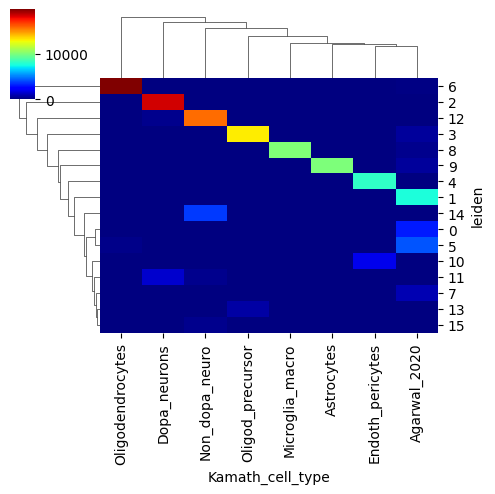

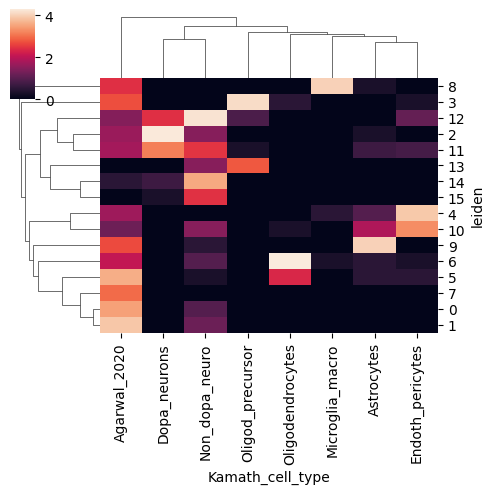

In [45]:
sns.clustermap(leiden_v_ct, cmap="jet", figsize=(5,5))
sns.clustermap(np.log10(leiden_v_ct + 1), figsize=(5,5))

## Manual annotation of clusters
* Clusters 2 and 11 express dopamine neuron markers (SLC18A2, SLC6A3, TH) and cluster 2 also NR4A2. Hence these two clusters were labeled as `dopamine neurons`
* The other neuron clusters (0, 1, 12, 14, 15) were labeled as `non-dopamine neurons`
* The remaining non-neuron clusters were easier to identify and assign labels
* In general, labeling matched Kamath annotations (see plots below)

In [107]:
## Markers from the Kamath et al 2022 (Fig. S1) + NR4A2
marker_genes_dic = {
    'NR4A2': 'Dopa neuron',
    'SLC18A2': 'Dopa neuron',
    'SLC6A3': 'Dopa neuron',
    'TH': 'Dopa neuron',
    'RBFOX3': 'All neurons',
    'AQP4': 'Astrocytes',
    'CX3CR1': 'Microglia / macroph.',
    'VCAN': 'Oligod. precursor',
    'OLIG1': 'Oligod. precursor',
    'CLDN5': 'Endoth / pericytes',
}

## Manual annotation of clusters
leiden_manual_labels_dic = {
    '2': 'Dopa neurons',
    '11': 'Dopa neurons',
    '0': 'Non-dopa neurons',
    '1': 'Non-dopa neurons',
    '12': 'Non-dopa neurons',
    '14': 'Non-dopa neurons',
    '15': 'Non-dopa neurons',
    '9': 'Astrocytes',
    '8': 'Microglia / macroph.',
    '3': 'Oligod. precursor',
    '13': 'Oligod. precursor',
    '5': 'Oligodendrocytes',
    '6': 'Oligodendrocytes',
    '4': 'Endoth / pericytes',
    '10': 'Endoth / pericytes',
    '7': 'Miscellaneous',
}

# Gene reported by Kamath 2022 as transcription factor specific to mammalian midbrain DA neurons
NR4A2_ENSG = "ENSG00000153234"

### All cell type markers

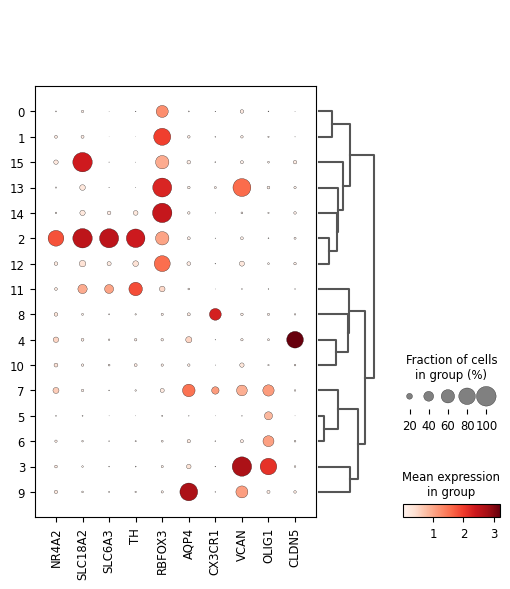

In [109]:
sc.pl.dotplot(adata, list(marker_genes_dic.keys()), groupby='leiden', dendrogram=True)

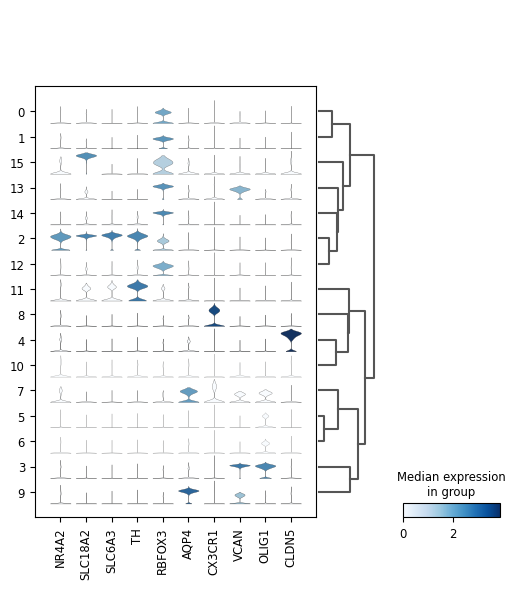

In [110]:
sc.pl.stacked_violin(adata, list(marker_genes_dic.keys()), groupby='leiden', dendrogram=True)

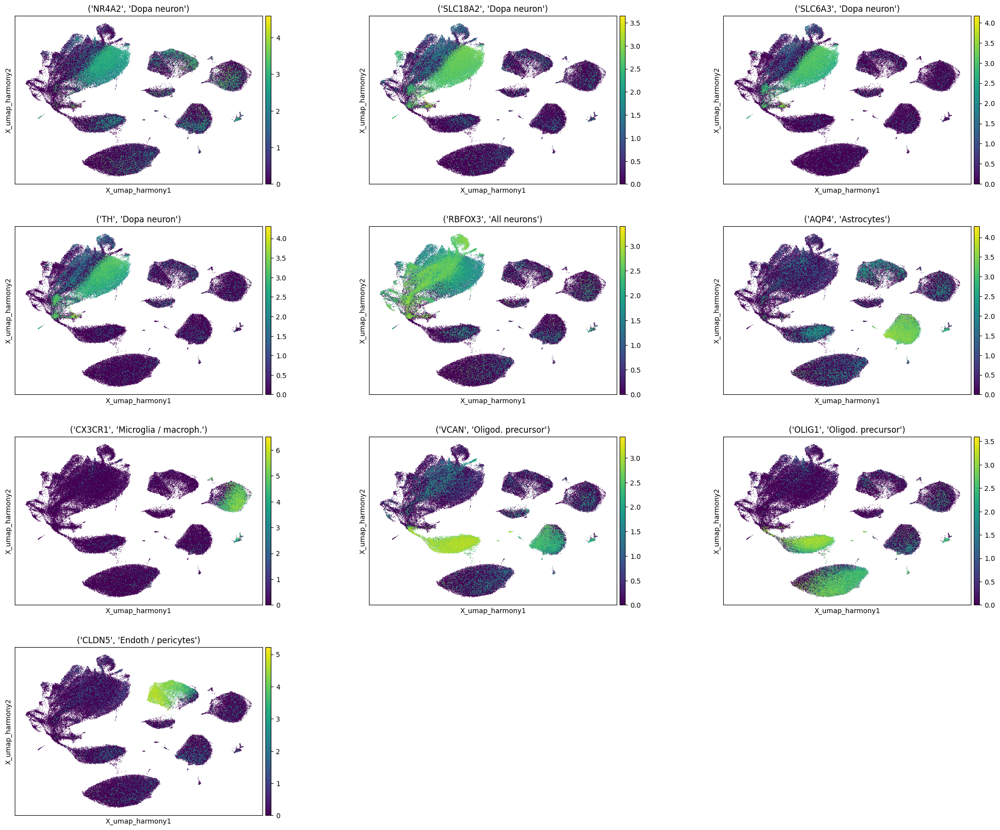

In [111]:
marker_titles = list(zip(list(marker_genes_dic.keys()), list(marker_genes_dic.values())))
plt.rcdefaults()
sc.pl.embedding(adata, basis='X_umap_harmony', color=list(marker_genes_dic.keys()), title=marker_titles,
                size=3, ncols = 3, wspace=0.3)

### Add new cell type labels to `.obs`

In [112]:
adata.obs['new_cell_type'] = adata.obs.replace({"leiden": leiden_manual_labels_dic})['leiden']

## Differential gene expression analysis

In [65]:
min_fc = 2
key_added = 'rank_genes_groups_filtered_fc' + str(min_fc)
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon', reference='rest', pts=True)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


### Reality check: Dopa neuron markers reported by Kamath 2022 are among the top-40 differentially expressed genes in cluster #2
* Filtering DGE by fold change > 4, shows even more prominent the importance of these markers (all in top-10)
* Interestingly, NR4A2 is not ranked as high as other markers (position 230, or 40 after FC>4 cutoff)
* This suggests that more in deep analysis are warranted for Dopa neuron subsets

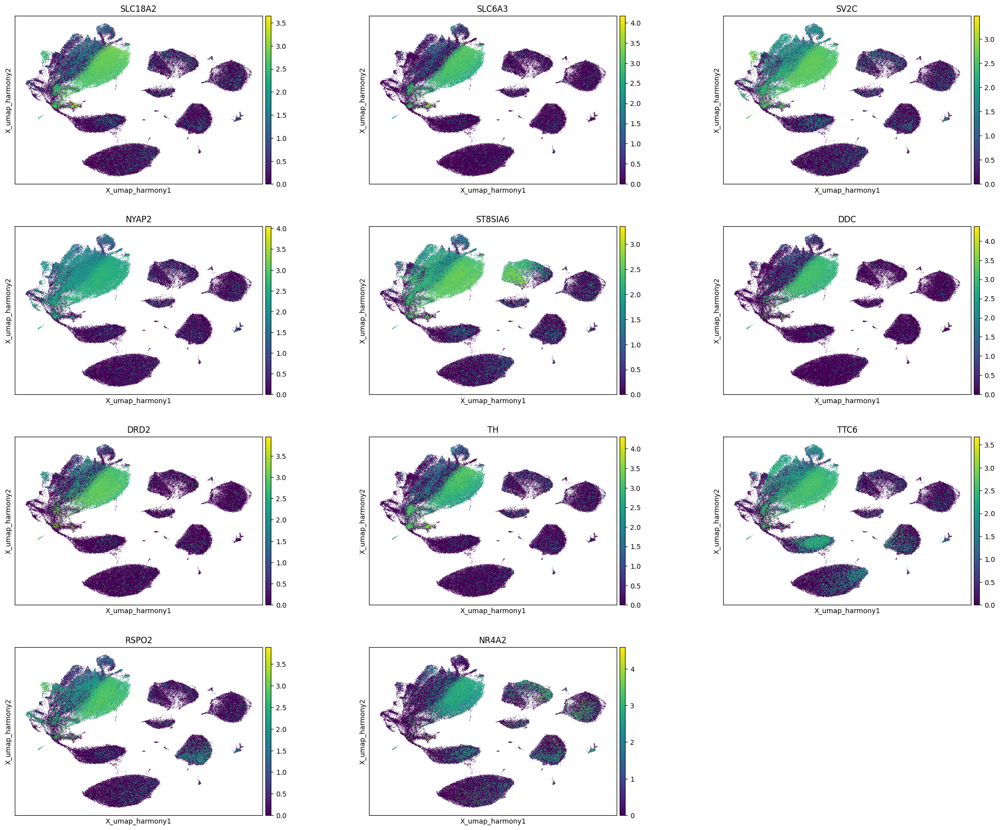

In [124]:
### Plot top-10 Differentually expressed genes, with Fold change > 4, and NR4A2
group = "2"
min_fc = 4
df = sc.get.rank_genes_groups_df(adata, group=group, log2fc_min=min_fc)
plt.rcdefaults()
sc.pl.embedding(adata, basis='X_umap_harmony', color=list(df['names'][0:10]) + ["NR4A2"], size=3, ncols = 3, wspace=0.3)

### DGE of Agarwal 2020 Non-dopa neurons neuron clusters (in process)

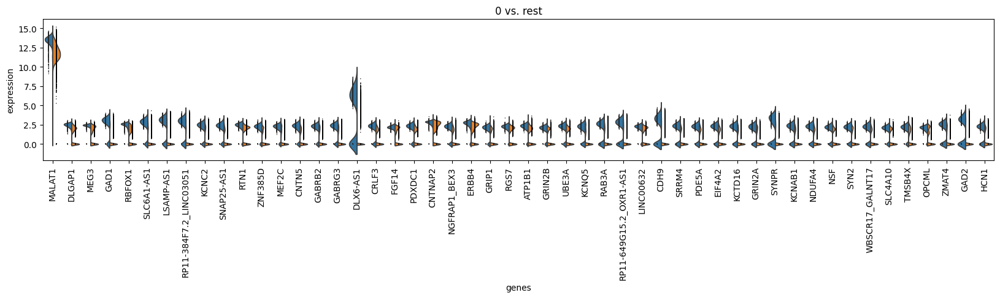

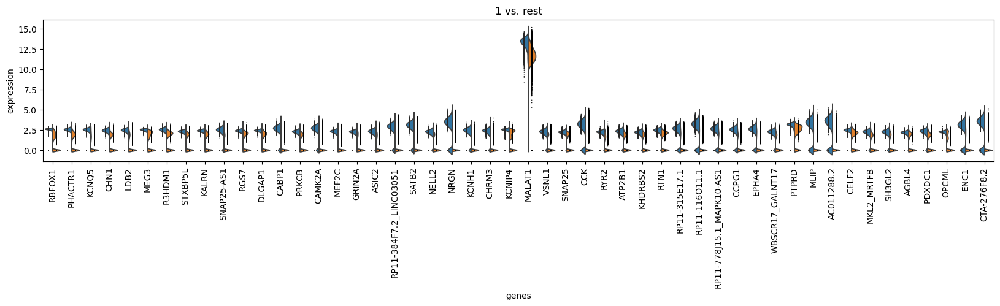

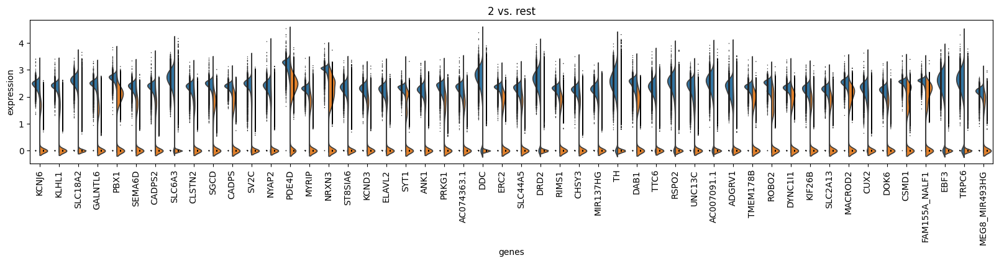

In [125]:
from matplotlib import rcParams
FIGSIZE = (20, 3)
rcParams["figure.figsize"] = FIGSIZE
sc.pl.rank_genes_groups_violin(adata, n_genes=50, jitter=False, groups=["0","1","2"])